In [1]:
# ! pip install prettytable

In [2]:
import sys
sys.path.insert(0, '/Users/ila/Desktop/Python/ООП')

import My_pandas as mpd
import My_numpy as mnp
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import warnings
warnings.filterwarnings('ignore')

# DSLR

##  V.1 Data Analysis

In [3]:
path = '/Users/ila/Desktop/Python/my projects/logistic_regression/'
data_tr = pd.read_csv(path + "resources/dataset_train.csv")
data_te = pd.read_csv(path + "resources/dataset_test.csv")

In [4]:
data_te

,Index,Hogwarts House,First Name,Last Name,Birthday,Best Hand,Arithmancy,Astronomy,Herbology,Defense Against the Dark Arts,Divination,Muggle Studies,Ancient Runes,History of Magic,Transfiguration,Potions,Care of Magical Creatures,Charms,Flying
0,0,NaN,Rico,Sargent,2001-10-06,Right,41642.0,696.096071,3.020172,-6.960961,7.996,-365.151850,393.138185,4.207691,1046.742736,3.668983,0.373853,-244.48172,-13.62
1,1,NaN,Tamara,Shackelford,1998-01-08,Left,45352.0,-370.844655,2.965226,3.708447,6.349,522.580486,602.853051,6.460017,1048.053878,8.514622,0.577432,-231.29200,-26.26
2,2,NaN,Staci,Crandall,1998-09-15,Left,43502.0,320.303990,-6.185697,-3.203040,4.619,-630.073207,588.071795,-5.565818,936.437358,1.850829,-1.647150,-252.99343,200.15
3,3,NaN,Dee,Gavin,2001-05-10,Right,61831.0,407.202928,4.962442,NaN,NaN,-449.179806,427.699966,NaN,1043.397718,4.656573,1.164708,-244.01660,-11.15
4,4,NaN,Gregory,Gustafson,1999-02-01,Right,NaN,288.337747,3.737656,-2.883377,4.886,-449.732166,385.712782,2.876347,1051.377936,2.750586,0.102104,-243.99806,-7.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,395,NaN,Maria,Kidwell,1999-02-06,Left,45857.0,-554.181932,-5.647655,5.541819,-3.799,-591.764651,392.973420,7.048482,1047.648405,10.408749,1.882786,-248.39978,-94.89
396,396,NaN,Frederic,Koonce,1997-11-11,Left,51842.0,632.233530,6.754862,-6.322335,3.294,-221.848397,319.360250,3.921402,1035.681313,-0.169741,-1.074303,-246.87982,-15.53
397,397,NaN,Eugene,Peralta,1998-11-14,Right,61982.0,292.108738,5.234530,-2.921087,4.230,-787.036050,433.259967,3.898160,1069.794110,6.495579,-2.286537,-244.01333,1.25
398,398,NaN,Allan,Bentley,1998-10-13,Left,56020.0,-726.418553,6.735582,7.264186,3.908,511.960762,613.391514,7.244499,1042.058804,7.554259,-0.788817,-228.24290,-18.27


In [5]:
dataset_train = mpd.read_csv("resources/dataset_train.csv")
dataset_test = mpd.read_csv("resources/dataset_test.csv")
dataset_train.head(types = 2)

+-------------------------------+---------------------+--------------------+---------------------+-----------------------+---------------------+
|            Field 1            |       Field 2       |      Field 3       |       Field 4       |        Field 5        |       Field 6       |
+-------------------------------+---------------------+--------------------+---------------------+-----------------------+---------------------+
|             index             |          0          |         1          |          2          |           3           |          4          |
|             Index             |         0.0         |        1.0         |         2.0         |          3.0          |         4.0         |
|         Hogwarts House        |      Ravenclaw      |     Slytherin      |      Ravenclaw      |       Gryffindor      |      Gryffindor     |
|           First Name          |        Tamara       |       Erich        |       Stephany      |         Vesta         |        

In [6]:
print(dataset_train.describe())

+---------+--------+--------+------------+-----------+-----------+-------------------------------+------------+----------------+---------------+------------------+-----------------+---------+---------------------------+----------+---------+
| Feature | index  | Index  | Arithmancy | Astronomy | Herbology | Defense Against the Dark Arts | Divination | Muggle Studies | Ancient Runes | History of Magic | Transfiguration | Potions | Care of Magical Creatures |  Charms  |  Flying |
+---------+--------+--------+------------+-----------+-----------+-------------------------------+------------+----------------+---------------+------------------+-----------------+---------+---------------------------+----------+---------+
|  Count  |  1600  |  1600  |    1566    |    1568   |    1567   |              1569             |    1561    |      1565      |      1565     |       1557       |       1566      |   1570  |            1560           |   1600   |   1600  |
|   Mean  | 799.5  | 799.5  |  49634

In [7]:
print(dataset_train.describe(types = '2'))

+-------------------------------+-------+----------+----------+-----------+----------+----------+----------+----------+
|            Features           | Count |   Mean   |   Std    |    Min    |   25%    |   50%    |   75%    |   Max    |
+-------------------------------+-------+----------+----------+-----------+----------+----------+----------+----------+
|             index             |  1600 |  799.5   |  461.88  |     0     |   400    |   800    |   1200   |   1599   |
|             Index             |  1600 |  799.5   |  461.88  |    0.0    |  400.0   |  800.0   |  1200.0  |  1599.0  |
|           Arithmancy          |  1566 | 49634.57 | 16674.48 |  -24370.0 | 38434.0  | 49018.0  | 60918.0  | 104956.0 |
|           Astronomy           |  1568 |  39.797  | 520.132  |  -966.741 | -489.494 | 261.645  |  525.91  | 1016.212 |
|           Herbology           |  1567 |  1.141   |  5.218   |  -10.296  |  -4.312  |  3.469   |  5.421   |  11.613  |
| Defense Against the Dark Arts |  1569 

## V.2 Data Visualization

### V.2.1 Histogram

Which Hogwarts course has a homogeneous score distribution between all four houses?

(Какой курс Хогвартса имеет одинаковое распределение баллов между всеми четырьмя факультетами?)

Ответ: Arithmancy, Care of Magical Creatures

Значит эти признаки можно сразу удалить, так как они не особо помогут разделить выборку 

In [8]:
set(dataset_train['Hogwarts House'])

{'Gryffindor', 'Hufflepuff', 'Ravenclaw', 'Slytherin'}

In [9]:
list_features = ['Arithmancy', 'Astronomy', 'Herbology', 'Defense Against the Dark Arts',
 'Divination', 'Muggle Studies', 'Ancient Runes', 'History of Magic', 'Transfiguration', 'Potions', 'Care of Magical Creatures', 'Charms', 'Flying']




In [10]:
Gryffindor = dataset_train[dataset_train['Hogwarts House'] == 'Gryffindor'].drop('Hogwarts House')
Hufflepuff = dataset_train[dataset_train['Hogwarts House'] == 'Hufflepuff'].drop('Hogwarts House')
Ravenclaw = dataset_train[dataset_train['Hogwarts House'] == 'Ravenclaw'].drop('Hogwarts House')
Slytherin = dataset_train[dataset_train['Hogwarts House'] == 'Slytherin'].drop('Hogwarts House')

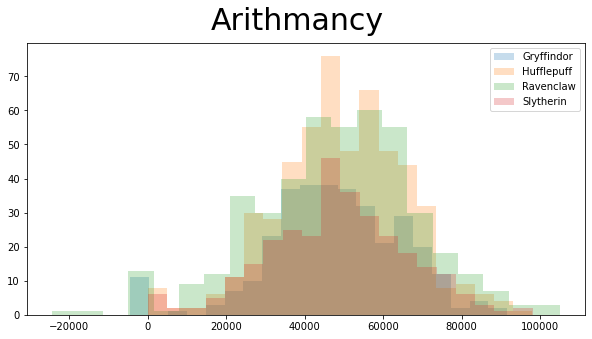

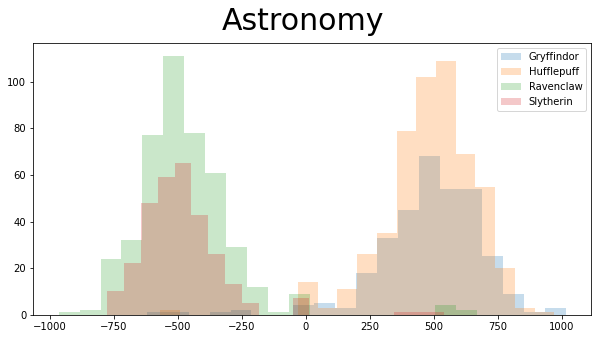

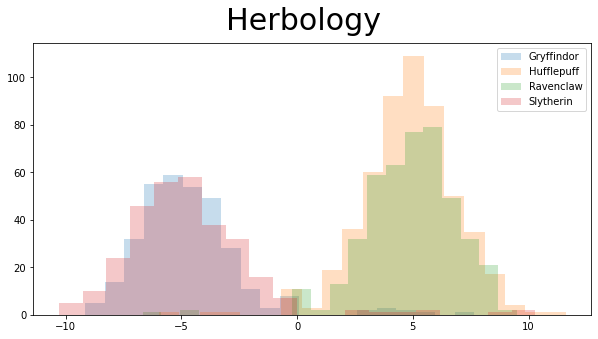

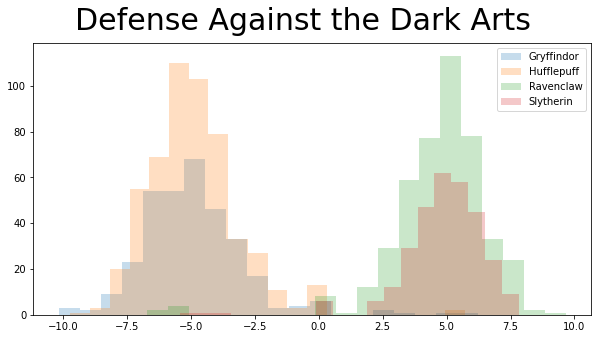

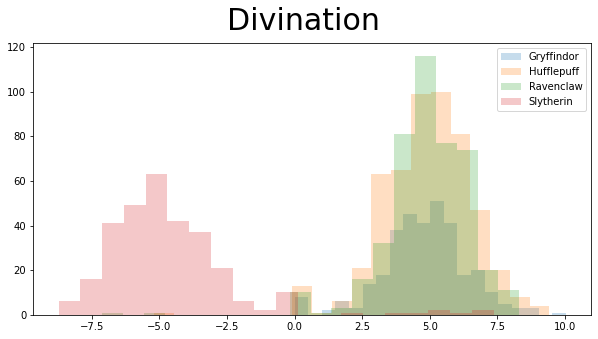

...

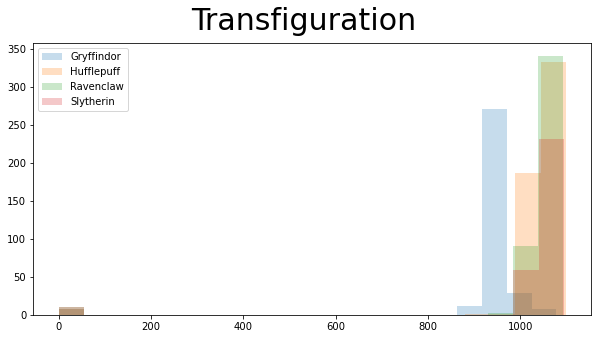

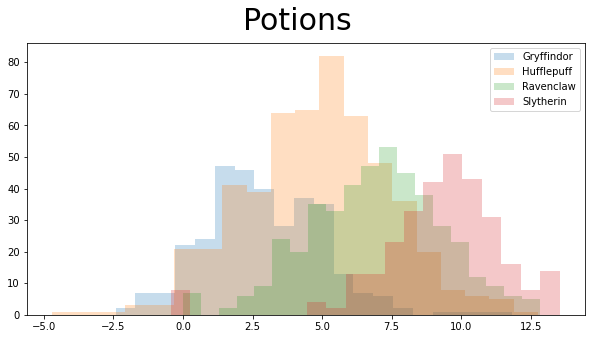

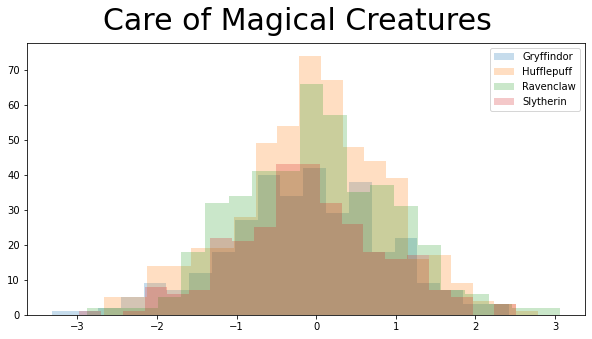

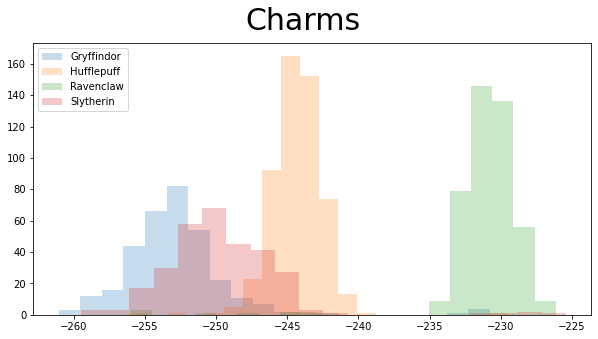

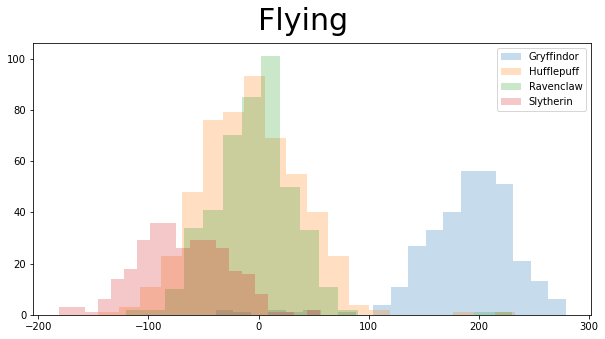

In [11]:
for column in list_features:
    fig, axs = plt.subplots(1, 1,figsize=(10, 5))
    fig.suptitle(column, fontsize = 30)
    
    axs.hist(Gryffindor[column], bins = 20, alpha = 0.25, label='Gryffindor')
    axs.hist(Hufflepuff[column], bins = 20, alpha = 0.25, label= 'Hufflepuff')
    axs.hist(Ravenclaw[column], bins = 20, alpha = 0.25, label = 'Ravenclaw')
    axs.hist(Slytherin[column], bins = 20, alpha = 0.25, label = 'Slytherin')
    
    axs.legend()

### V.2.2 Scatter plot

What are the two features that are similar ?

(Какие две функции похожи?)

Ответ: Astronomy и Defense Against the Dark Arts

Один из них можно смело удалять 

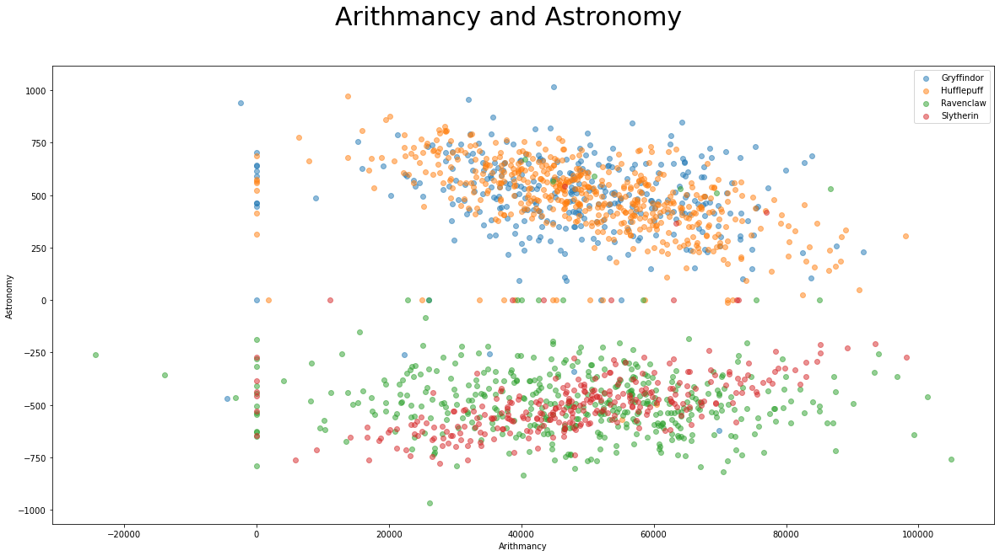

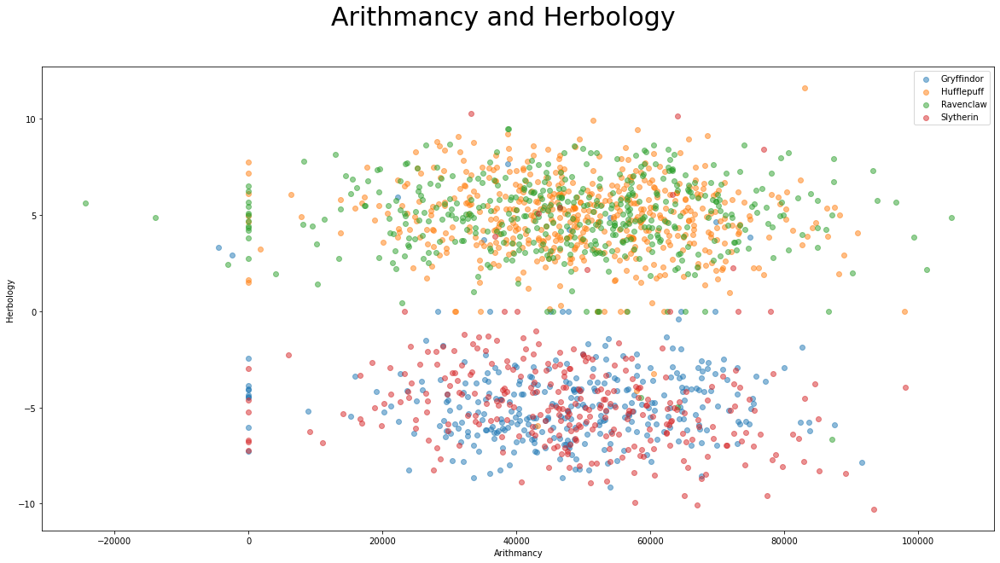

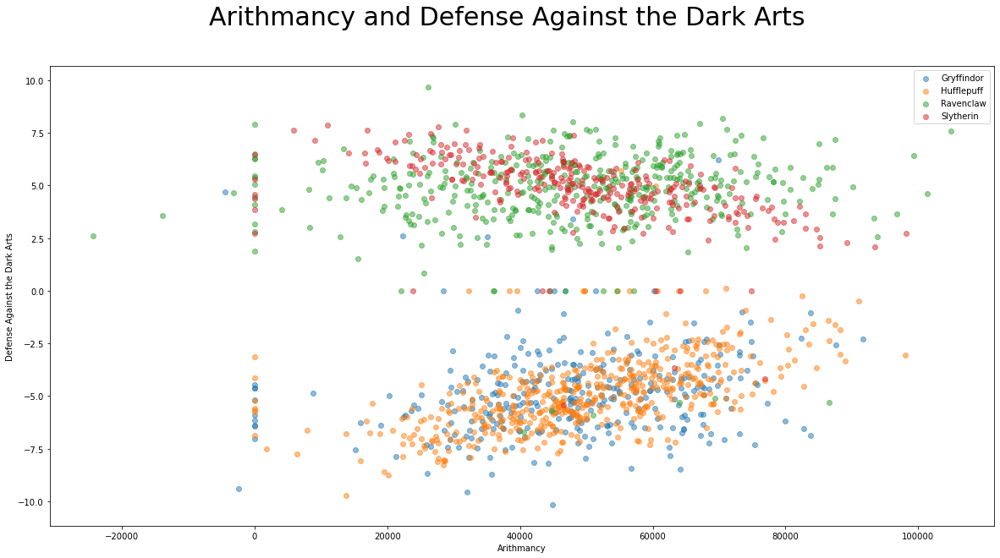

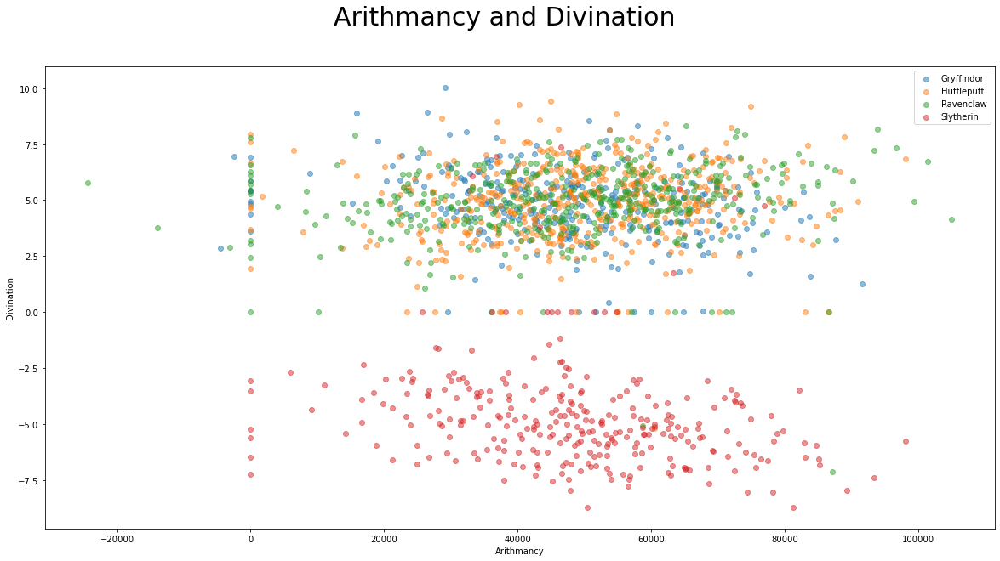

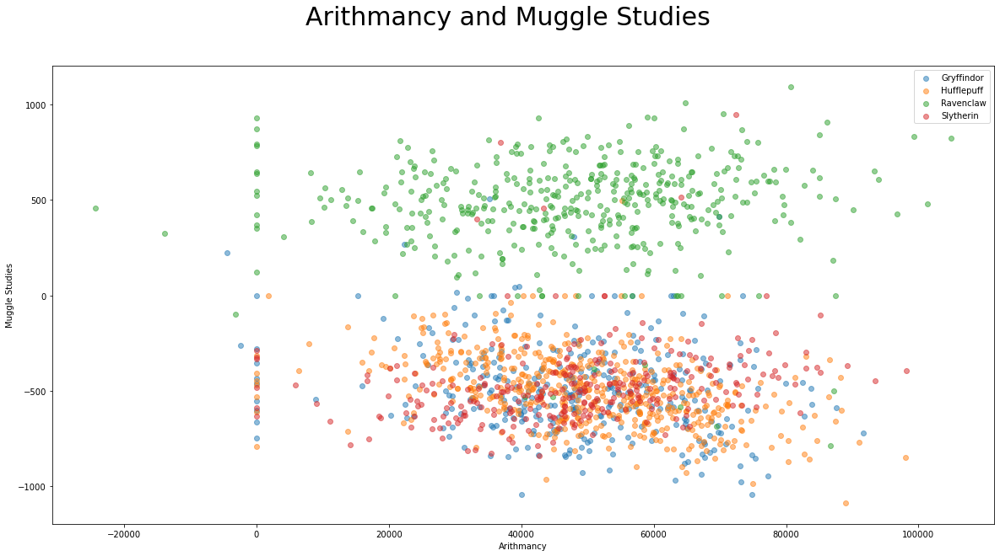

...

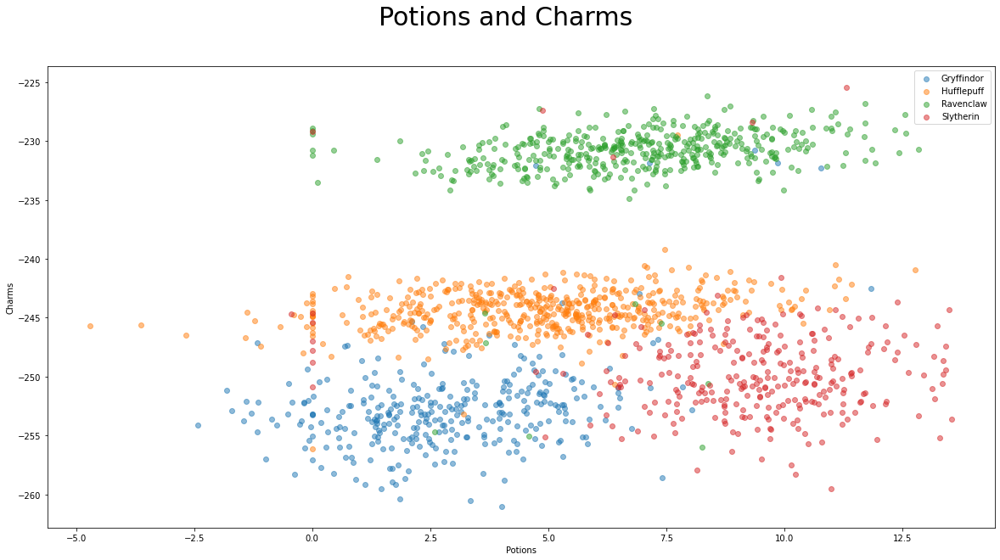

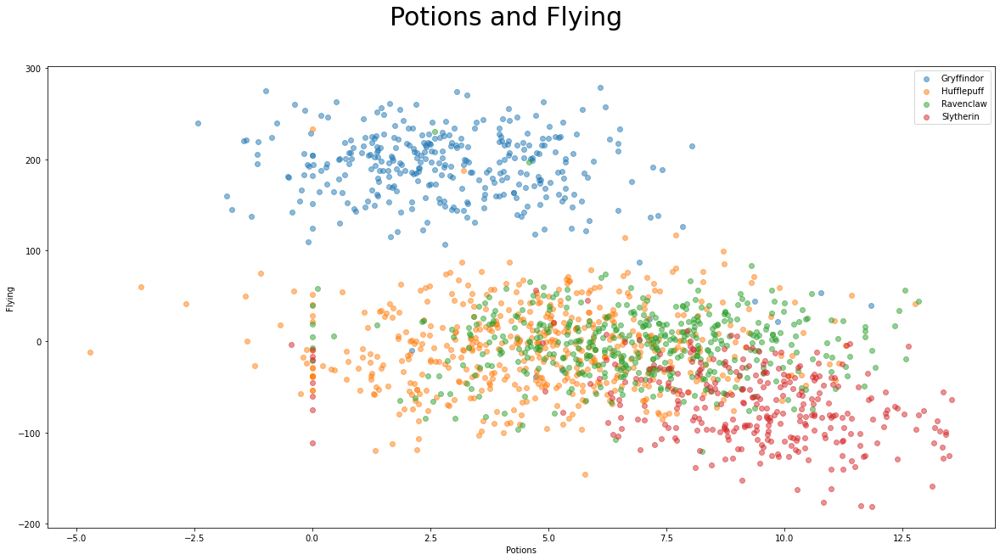

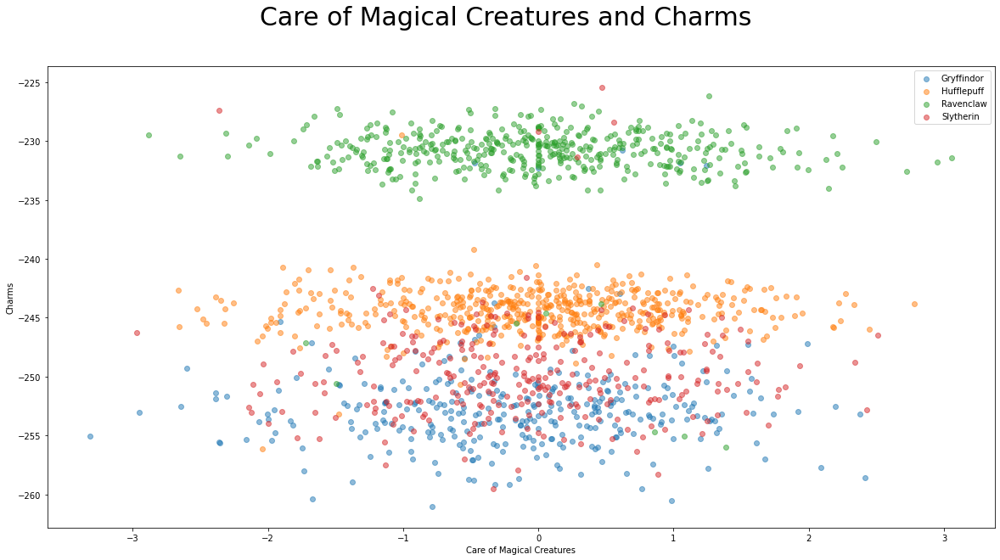

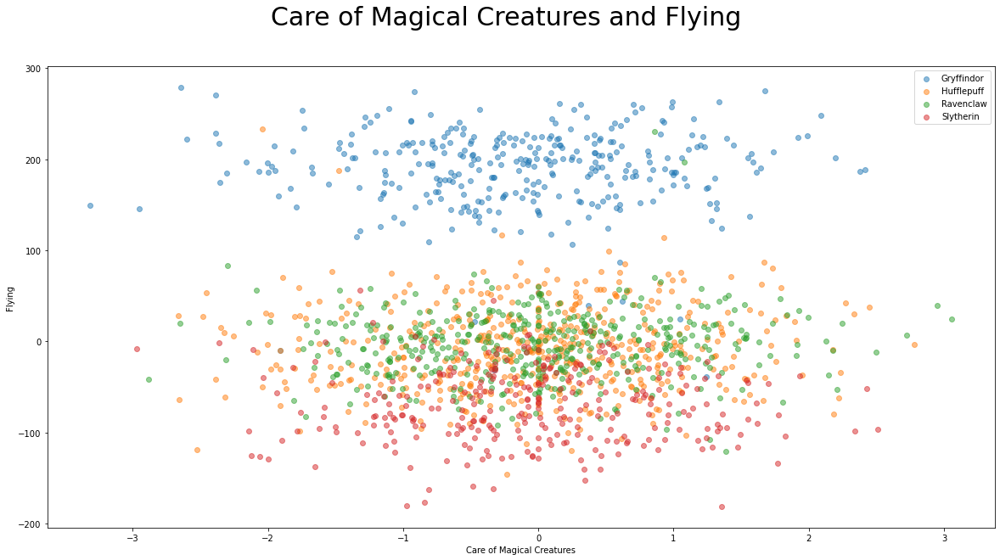

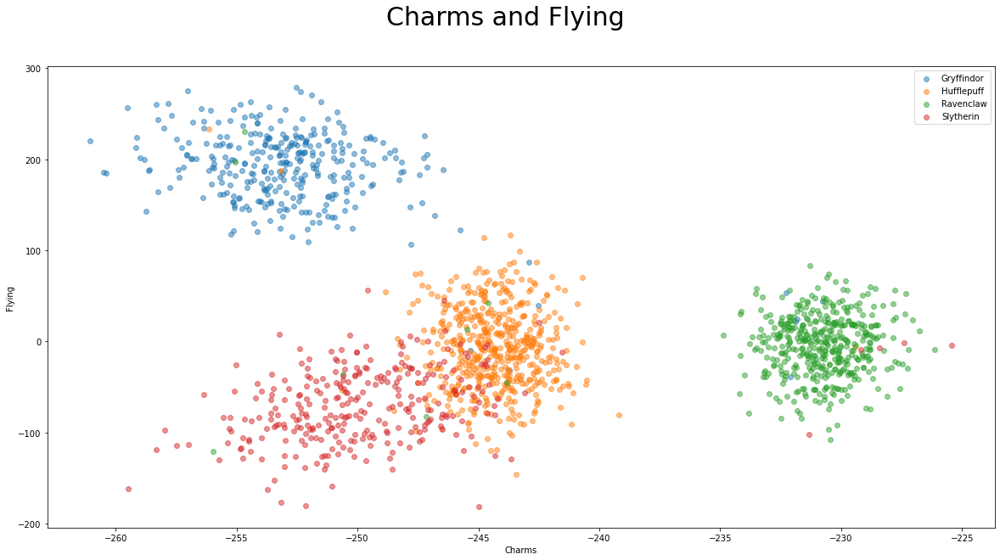

In [12]:
for column1 in list_features:
    index = list_features.index(column1) + 1
    for column2 in list_features[index:]:
        if column1 != column2:
            
            fig, axs = plt.subplots(1, 1, figsize=(20, 10))
            fig.suptitle(column1 + ' and ' + column2, fontsize = 30)
            
            axs.scatter(Gryffindor[column1], Gryffindor[column2], alpha = 0.5, label='Gryffindor')
            axs.scatter(Hufflepuff[column1], Hufflepuff[column2], alpha = 0.5, label='Hufflepuff')
            axs.scatter(Ravenclaw[column1], Ravenclaw[column2], alpha = 0.5, label='Ravenclaw')
            axs.scatter(Slytherin[column1], Slytherin[column2], alpha = 0.5, label='Slytherin')
            
            axs.set_xlabel(column1)
            axs.set_ylabel(column2)
            axs.legend()


### V.2.3 Pair plot

From this visualization, what features are you going to use for your logistic regression?

(Из этой визуализации, какие признаки вы собираетесь использовать для своей логистической регрессии?)

Ответ: Astronomy, Charms, Ancient Runes, Defense Against the Dark Arts, Divination, Ancient Runes, Herbology, Flying, History of Magic

Так как они лучше все разделяют выборку между собой

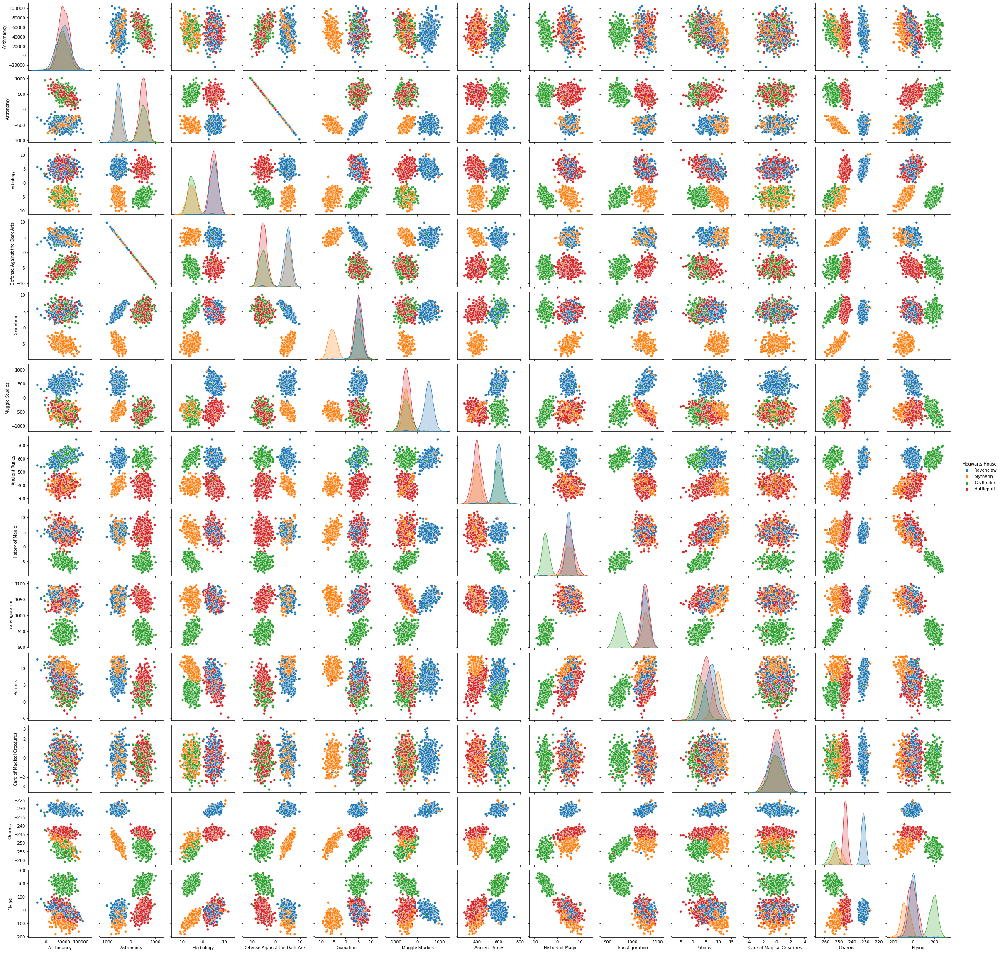

In [13]:
sns.pairplot(data_tr.drop('Index', 1), hue = 'Hogwarts House')

## V.3 Logistic Regression

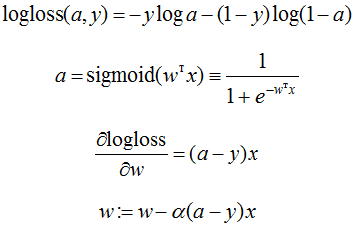

In [7]:
class ft_Logistic_Regression():
    exp = 2.7182818284

    def __init__(self, lr = 0.1, n_epochs=1000, min_err=0.2, n_clas=2, penalty=None, penalty_param=0.05,
                 stochastic=False, chunk_size=5, seed = 21):
        self.lr = lr
        self.n_epochs = n_epochs
        self.min_err = min_err
        self.n_clas = n_clas
        self.penalty_param = penalty_param
        self.stochastic = stochastic
        self.chunk_size = chunk_size
        self.seed = seed
        if penalty == 'l1':
            self.penalty = self.__l1_penalty__
        elif penalty == 'l2':
            self.penalty = self.__l2_penalty__
        else:
            self.penalty = self.__none_penalty__
        if self.n_clas != 2:
            self.multiflag = True
        else:
            self.multiflag = False

    def sign(self, n):
        if isinstance(n, (int, float)):
            if n >= 0:
                return 1
            return -1
        else:
            return mnp.Array([1 if i >= 0 else -1 for i in n])

    def __l1_penalty__(self):
        return self.penalty_param * self.sign(self.w_mas)

    def __l2_penalty__(self):
        return [w * self.penalty_param for w in self.w_mas]  # * 2

    def __none_penalty__(self):
        return 0

    def regression(self, data, w_mas):  # Линейный алгоритм
        sums = []
        for row in data.data[1:, 1:]:
            sums += [(row * w_mas).sum()]
        return sums

    def sigmoid(self, regs):
        sigmoids = []
        for reg in regs:
            if reg > 100:
                reg = 100
            elif reg < -100:
                reg = -100
            sigmoids += [1 / (1 + self.exp ** -(reg))]
        return mnp.Array(sigmoids)

    def Logloss(self, sigs, targets):
        sums = 0
        eps = 1e-15
        for sig, target in zip(sigs, targets):
            if sig == 1 or sig == 0:
                sig = max(eps, min(1 - eps, sig))
            res = -(target * np.log(sig) + (1 - target) * np.log(1 - sig))
            sums += res
        return sums / len(sigs)

    def derivative(self, sigs, targets, data):
        der_w = mnp.Array([])
        rasn_sig_tar = sigs - targets
        for column in data.columns[1:]:
            der_w.append(mnp.Array(rasn_sig_tar * data[column]).mean())
        return der_w

    def multiclass_fit(self, data, targets):
        self.multiflag = False
        self.dict_multiclass = {}
        for target in set(targets):
            copy_target = [1 if i == target else 0 for i in targets]
            self.fit(data, copy_target)
            self.dict_multiclass[target] = self.w_mas
        self.multiflag = True

    def argmx_dict(self, dicts):
        mas_target = []
        for i in range(len(list(dicts.values())[0])):
            max_int = float('-inf')
            for key in dicts.keys():
                if dicts[key][i] > max_int:
                    target = key
                    max_int = dicts[key][i]
            mas_target.append(target)
        return mas_target

    def multiclass_predict(self, data):
        self.multiflag = False
        d = {}
        for key in self.dict_multiclass.keys():
            d[key] = self.predict_proba(data, w_mas=self.dict_multiclass[key])
        self.multiflag = True
        return self.argmx_dict(d)

    def fit(self, data, target):
        if self.multiflag == True:
            return self.multiclass_fit(data, target)

        data['dop_par'] = [1] * data.shape[0]
        self.w_mas = [0] * (data.shape[1])
        self.mas_logloss = []
        self.mas_w_er = [0]
        np.random.seed(self.seed)
        for epoch in range(self.n_epochs):
            reg = self.regression(data, self.w_mas)
            sig = self.sigmoid(reg)

            if self.stochastic == True:
                rand_st = np.random.randint(data.shape[0] - self.chunk_size)
                rand_fn = rand_st + self.chunk_size
                der_w = self.derivative(sig[rand_st:rand_fn], target[rand_st:rand_fn], train_data.iloc(rand_st, rand_fn))
            else:
                der_w = self.derivative(sig, target, data)
            
            self.w_mas = self.w_mas - self.lr * (der_w + self.penalty())
            log = self.Logloss(sig, target)
            self.mas_logloss.append(log)
            self.mas_w_er.append(self.w_mas[1])
            if log <= self.min_err:
                break

        data = data.drop('dop_par')

    def predict_proba(self, data, multiclass=None, w_mas=None):
        if self.multiflag == True:
            return self.multiclass_predict(data)
        if w_mas == None:
            w_mas = self.w_mas
        data['dop_par'] = [1] * data.shape[0]

        reg = self.regression(data, w_mas)
        sig = self.sigmoid(reg)

        data = data.drop('dop_par')
        self.w_mas = w_mas
        return sig

    def predict(self, data, okrugl=0.5):
        sig = self.predict_proba(data)
        return [1 if i >= okrugl else 0 for i in sig]


In [9]:
train_data = dataset_train.drop('Hogwarts House').drop('First Name').drop('Last Name').drop('Birthday').drop('Best Hand').drop('Index').drop('Potions').drop('Arithmancy').drop('Muggle Studies').drop('Transfiguration').drop('Care of Magical Creatures')
test_data = dataset_test.drop('Hogwarts House').drop('First Name').drop('Last Name').drop('Birthday').drop('Best Hand').drop('Index').drop('Potions').drop('Arithmancy').drop('Muggle Studies').drop('Transfiguration').drop('Care of Magical Creatures')
# train_data = dataset_train.drop('Hogwarts House').drop('First Name').drop('Last Name').drop('Birthday').drop('Best Hand').drop('Index')
# test_data = dataset_test.drop('Hogwarts House').drop('First Name').drop('Last Name').drop('Birthday').drop('Best Hand').drop('Index')

train_target = dataset_train['Hogwarts House']
test_target = dataset_test['Hogwarts House']

train_data.fillna(0)
test_data.fillna(0)
train_data.norm()
test_data.norm()
data_tr2 = data_tr.drop(['Index', 'Hogwarts House', 'First Name', 'Last Name', 'Birthday', 'Best Hand', 'Potions', 'Arithmancy', 'Muggle Studies', 'Transfiguration', 'Care of Magical Creatures'], 1).fillna(0)
data_te2 = data_te.drop(['Index', 'Hogwarts House', 'First Name', 'Last Name', 'Birthday', 'Best Hand', 'Potions', 'Arithmancy', 'Muggle Studies', 'Transfiguration', 'Care of Magical Creatures'], 1).fillna(0)

In [10]:
log_reg = LogisticRegression(random_state = 42)
log_reg.fit(data_tr2, train_target)
pred = log_reg.predict(data_te2)

In [11]:
%%time
my_log = ft_Logistic_Regression(n_clas = 4, lr = 1,stochastic=True, chunk_size=200)
my_log.fit(train_data, train_target)
m_pred = my_log.predict_proba(test_data)
accuracy_score(pred, m_pred)

CPU times: user 2.6 s, sys: 5.61 ms, total: 2.61 s
Wall time: 2.61 s


0.9925